In [54]:
%load_ext autoreload
%autoreload complete

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
import statsmodels.api as sm
from matplotlib_inline.backend_inline import set_matplotlib_formats
from tqdm.notebook import tqdm

from protest_impact.util import cache, project_root

set_matplotlib_formats("svg")

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [55]:
df = pd.read_csv(project_root / "data/daily_data.csv", parse_dates=["date"])
df.shape

(15344, 41)

In [56]:
instrument_names = dict(
    prcp="daily precipitation total in mm",
    snow="snow depth in mm",
    tavg="average air temperature in °C",
    tmax="maximum air temperature in °C",
    tmin="minimum air temperature in °C",
    wdir="wind direction",
    wspd="average wind speed in km/h",
    wpgt="peak wind gust in km/h",
    tsun="daily sunshine total in minutes (m)",
    pres="average sea-level air pressure in hPa",
)

In [57]:
count = df["count_moderate"] + df["count_radical"]
size = df["size_moderate"] + df["size_radical"]
df["t_protests"] = (count > 0).astype(int)
df["t_size"] = np.log10(size + 1)
protests = df.query(f"t_size > 0")

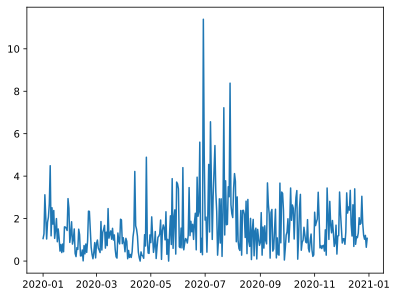

In [58]:
df_ = df.query("region == 'Berlin' & date < '2020-12-31'").copy()
plt.plot(df_["date"], df_["instr_longterm_prcp"])

In [59]:
def smooth(col):
    return (
        df.groupby("region")[col]
        .rolling(window=14, win_type="gaussian", center=True, min_periods=1)
        .mean()
        .reset_index(0, drop=True)
    )


df["instr_smoothed_prcp"] = smooth("instr_prcp")
df["instr_longterm_smoothed_prcp"] = smooth("instr_longterm_prcp")

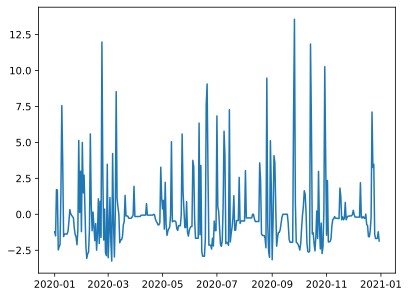

In [60]:
df["instr_rest_prcp"] = df["instr_prcp"] - df["instr_smoothed_prcp"]
df_ = df.query("region == 'Berlin' & date < '2020-12-31'").copy()
plt.plot(df_["date"], df_["instr_rest_prcp"])

In [66]:
sns.jointplot(data=df, x="instr_prcp", y="t_size", s=5, alpha=0.3)

In [67]:
sns.jointplot(data=df, x="instr_longterm_prcp", y="t_size", s=5, alpha=0.3)

In [68]:
sns.jointplot(data=df, x="instr_rest_prcp", y="t_size", s=5, alpha=0.3)

In [69]:
sm.OLS.from_formula("t_size ~ instr_prcp", data=df).fit().summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                 t_size   R-squared:                       0.000
Model:                            OLS   Adj. R-squared:                  0.000
Method:                 Least Squares   F-statistic:                     1.084
Date:                Thu, 22 Jun 2023   Prob (F-statistic):              0.298
Time:                        18:16:37   Log-Likelihood:                -3602.4
No. Observations:               15344   AIC:                             7209.
Df Residuals:                   15342   BIC:                             7224.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      0.0387      0.003     14.369      0.000       0.033       0.044
instr_prcp    -0.0006      0.001     -1.041      0.298      -0.002       0.001
==============================================================================
Omnibus:                    22734.606   Durbin-Watson:                   1.285
Prob(Omnibus):                  0.000   Jarque-Bera (JB):          6157901.415
Skew:                           9.360   Prob(JB):                         0.00
Kurtosis:                      99.340   Cond. No.                         4.79
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [150]:
df["instr_prcp_dummy"] = (df["instr_prcp"] > 1).astype(int)

In [151]:
sm.OLS.from_formula("t_protests ~ instr_prcp_dummy", data=df).fit().summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:             t_protests   R-squared:                       0.000
Model:                            OLS   Adj. R-squared:                  0.000
Method:                 Least Squares   F-statistic:                     2.448
Date:                Thu, 22 Jun 2023   Prob (F-statistic):              0.118
Time:                        19:12:11   Log-Likelihood:                 6893.9
No. Observations:               15344   AIC:                        -1.378e+04
Df Residuals:                   15342   BIC:                        -1.377e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
====================================================================================
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
Intercept            0.0257      0.001     17.340      0.000       0.023       0.029
instr_prcp_dummy    -0.0043      0.003     -1.565      0.118      -0.010       0.001
==============================================================================
Omnibus:                    17240.779   Durbin-Watson:                   1.629
Prob(Omnibus):                  0.000   Jarque-Bera (JB):           922380.384
Skew:                           6.158   Prob(JB):                         0.00
Kurtosis:                      38.931   Cond. No.                         2.43
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [152]:
def get_shifted_metrics(col, t=0):
    metrics = dict()
    for i in tqdm(np.arange(-28, 28)):
        shifted = df.groupby("region")[col].shift(i).fillna(0)
        shifted_dummy = (shifted > t).astype(int)
        shifted_dummy.name = "shifted_dummy"
        model = sm.OLS.from_formula("t_protests ~ shifted_dummy", data=df).fit()
        metrics[i] = dict(
            coef=model.params["shifted_dummy"],
            se=model.bse["shifted_dummy"],
            ci_lower=model.conf_int().loc["shifted_dummy", 0],
            ci_upper=model.conf_int().loc["shifted_dummy", 1],
            pvalue=model.pvalues["shifted_dummy"],
            rsquared=model.rsquared,
            fstat=model.fvalue,
        )
    metrics = pd.DataFrame(metrics).T
    return metrics


metrics = get_shifted_metrics("instr_prcp")

  0%|          | 0/56 [00:00<?, ?it/s]

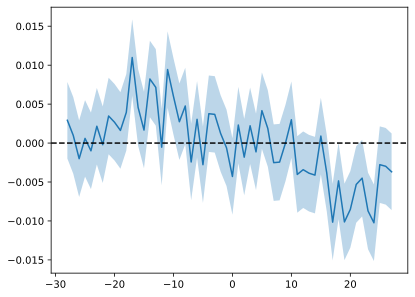

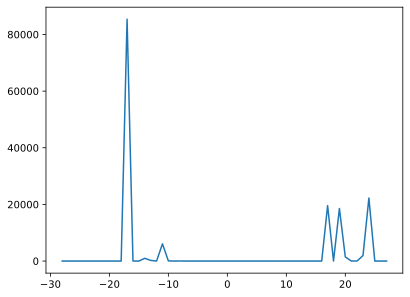

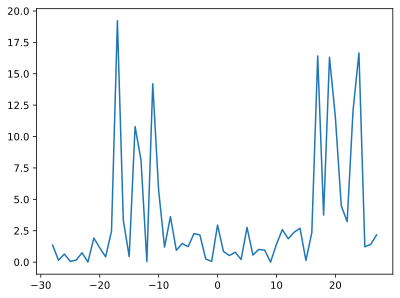

In [153]:
def plot_shifted_metrics(metrics):
    plt.plot(metrics.index, metrics["coef"])
    plt.fill_between(metrics.index, metrics["ci_lower"], metrics["ci_upper"], alpha=0.3)
    plt.axhline(0, color="black", linestyle="--")
    plt.show()
    plt.plot(metrics.index, 1 / metrics["pvalue"])
    plt.show()
    plt.plot(metrics.index, metrics["fstat"])
    plt.show()


plot_shifted_metrics(metrics)

  0%|          | 0/56 [00:00<?, ?it/s]

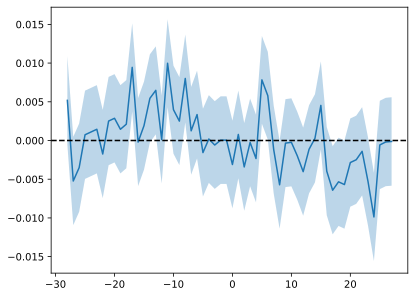

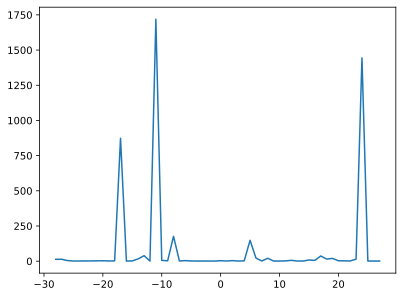

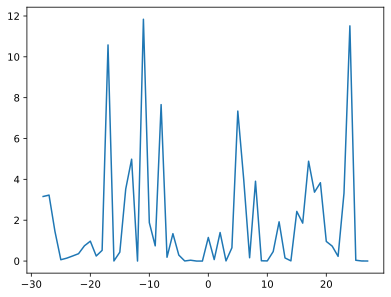

In [154]:
metrics = get_shifted_metrics("instr_rest_prcp")
plot_shifted_metrics(metrics)

In [123]:
df["instr_prcp_7days"] = (
    df.groupby("region")["instr_prcp"]
    .rolling(window=7, min_periods=1)
    .mean()
    .reset_index(0, drop=True)
)
sns.jointplot(data=df, x="instr_prcp_7days", y="t_size", s=5, alpha=0.3)

In [118]:
df["instr_rest_prcp_7days_dummy"] = (df["instr_prcp_7days"] > 0.1).astype(int)
sm.OLS.from_formula("t_size ~ instr_prcp_7days_dummy", data=df).fit().summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                 t_size   R-squared:                       0.000
Model:                            OLS   Adj. R-squared:                  0.000
Method:                 Least Squares   F-statistic:                     2.665
Date:                Thu, 22 Jun 2023   Prob (F-statistic):              0.103
Time:                        18:47:35   Log-Likelihood:                -3601.6
No. Observations:               15344   AIC:                             7207.
Df Residuals:                   15342   BIC:                             7223.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==========================================================================================
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
Intercept                  0.0466      0.006      7.700      0.000       0.035       0.058
instr_prcp_7days_dummy    -0.0108      0.007     -1.633      0.103      -0.024       0.002
==============================================================================
Omnibus:                    22729.305   Durbin-Watson:                   1.286
Prob(Omnibus):                  0.000   Jarque-Bera (JB):          6149024.247
Skew:                           9.356   Prob(JB):                         0.00
Kurtosis:                      99.269   Cond. No.                         4.71
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [121]:
metrics = get_shifted_metrics("instr_prcp_7days", t=0.1)

  0%|          | 0/56 [00:00<?, ?it/s]

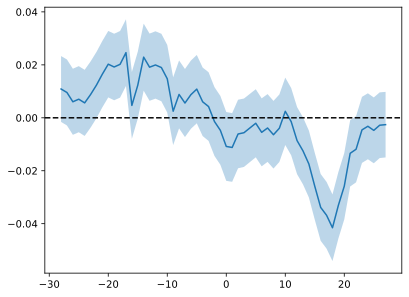

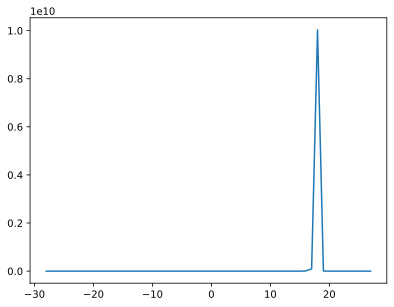

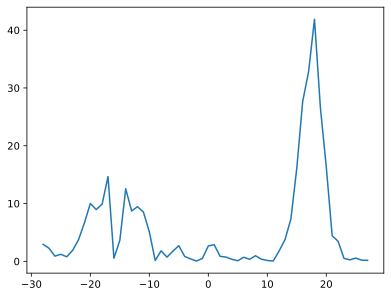

In [122]:
plot_shifted_metrics(metrics)

In [ ]:
df["prcp_shifted_18"] = df.groupby("region")["instr_prcp"].shift(18).fillna(0)
sns.jointplot(data=df, x="prcp_shifted_18", y="t_size", s=5, alpha=0.3)

In [ ]:
df["prcp_shifted_m14"] = df.groupby("region")["instr_prcp"].shift(-14).fillna(0)
sns.jointplot(data=df, x="prcp_shifted_m14", y="t_size", s=5, alpha=0.3)

In [131]:
sm.OLS.from_formula("t_size ~ prcp_shifted_m14", data=df).fit().summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                 t_size   R-squared:                       0.000
Model:                            OLS   Adj. R-squared:                 -0.000
Method:                 Least Squares   F-statistic:                    0.1806
Date:                Thu, 22 Jun 2023   Prob (F-statistic):              0.671
Time:                        18:56:06   Log-Likelihood:                -3602.9
No. Observations:               15344   AIC:                             7210.
Df Residuals:                   15342   BIC:                             7225.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
====================================================================================
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
Intercept            0.0371      0.003     13.806      0.000       0.032       0.042
prcp_shifted_m14     0.0003      0.001      0.425      0.671      -0.001       0.001
==============================================================================
Omnibus:                    22735.868   Durbin-Watson:                   1.286
Prob(Omnibus):                  0.000   Jarque-Bera (JB):          6160174.914
Skew:                           9.361   Prob(JB):                         0.00
Kurtosis:                      99.358   Cond. No.                         4.77
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [134]:
len(df.query("t_size > 0"))

278

In [133]:
df.query("t_size > 0")["prcp_shifted_m14"].value_counts()

0.0     125
0.2      12
0.5      10
0.3       9
0.4       7
       ... 
4.0       1
4.8       1
8.8       1
4.4       1
14.0      1
Name: prcp_shifted_m14, Length: 70, dtype: int64

In [ ]:
df.query("t_size > 0")["prcp_shifted_m14"].hist(bins=100)